# Greenland Sea example: Floe identification and tracking
This example demonstrates the IFT for a 300 km by 300 km image centered at 75.78 S, 39.1 W 

* Get landmask tiff (extract corner coords)
* Update list of passtimes
* Set up and export preprocessing, cloud masking
* Binarization + Floe splitting
* Tracking
* Saving data

Here we also have the results of the LopezAcosta2019Tiling algorithm to compare to.

In [38]:
using Pkg
Pkg.activate("ift_joss")

using IceFloeTracker
using Images
using DataFrames
using CairoMakie
using StatsBase


  Activating project at `~/Documents/research/manuscripts/ice_floe_tracker_joss/notebooks/ift_joss`


In [39]:
include("weddell_sea_example.jl")

dist_morph_split (generic function with 1 method)

In [40]:
dataloc = "../data/greenland_sea"
files = filter(r -> occursin("greenland-sea", r), readdir(dataloc))
files = filter(r -> occursin("aqua", r) | occursin("terra", r), readdir(dataloc))
sort!(files)

10-element Vector{String}:
 "greenland-sea-300km.250m.2023-05-16.aqua"
 "greenland-sea-300km.250m.2023-05-16.terra"
 "greenland-sea-300km.250m.2023-05-17.aqua"
 "greenland-sea-300km.250m.2023-05-17.terra"
 "greenland-sea-300km.250m.2023-05-18.aqua"
 "greenland-sea-300km.250m.2023-05-18.terra"
 "greenland-sea-300km.250m.2023-05-19.aqua"
 "greenland-sea-300km.250m.2023-05-19.terra"
 "greenland-sea-300km.250m.2023-05-20.aqua"
 "greenland-sea-300km.250m.2023-05-20.terra"

In [54]:
# Passtimes from SOIT
# passtimes = [
#     "2026-04-20 12:07", # aqua
#     "2026-04-20 13:35", # terra
#     "2026-04-21 11:07", # aqua
#     "2026-04-21 12:36", # terra
#     "2026-04-22 11:45", # aqua
#     "2026-04-22 13:15", # terra
#     "2026-04-23 10:45", # aqua
#     "2026-04-23 13:54" # terra
#     ]


passtimes = [
    "2023-05-16T12:11", # aqua
    "2023-05-16T12:33", # terra
    "2023-05-17T12:53", # aqua
    "2023-05-17T13:14", # terra
    "2023-05-18T13:35", # aqua
    "2023-05-18T13:55", # terra
    "2023-05-19T12:39", # aqua
    "2023-05-19T12:58", # terra
    "2023-05-20T13:21",
    "2023-05-20T13:39"
    ]

using Dates
passtimes = Dates.DateTime.(passtimes, "yyyy-mm-ddTHH:MM")

10-element Vector{DateTime}:
 2023-05-16T12:11:00
 2023-05-16T12:33:00
 2023-05-17T12:53:00
 2023-05-17T13:14:00
 2023-05-18T13:35:00
 2023-05-18T13:55:00
 2023-05-19T12:39:00
 2023-05-19T12:58:00
 2023-05-20T13:21:00
 2023-05-20T13:39:00

In [42]:
truecolor_imgs = load.(joinpath.(dataloc, files, "truecolor.tiff"))
falsecolor_imgs = load.(joinpath.(dataloc, files, "falsecolor.tiff"));
landmask_img = load.(joinpath.(dataloc, "greenland-sea-300km", "250m.2023.landmask_raw.tiff"));

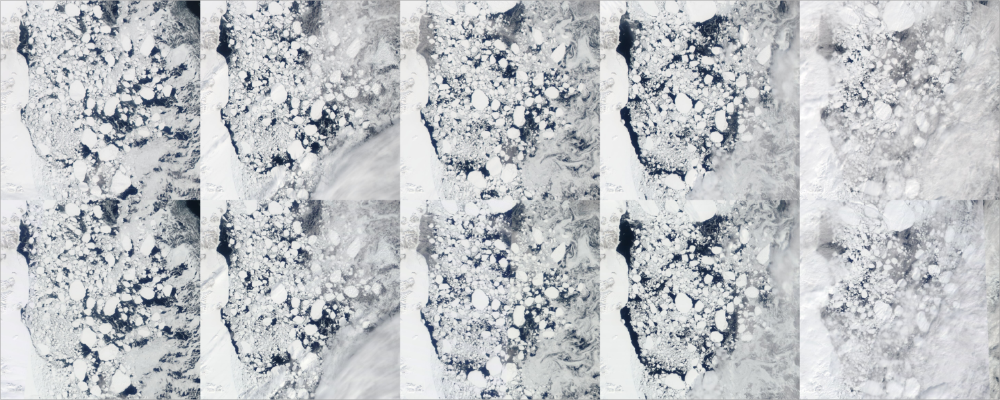

In [43]:
mosaicview(truecolor_imgs, nrow=2)

In [44]:
land_masks = [Gray.(landmask_img) .> 0 for idx in range(1, length(truecolor_imgs))]
cloud_masks = Watkins2025CloudMask().(falsecolor_imgs)
proc_gray_imgs = Preprocess().(truecolor_imgs, land_masks, land_masks);
joint_masks = ((x, y) -> x .|| y).(land_masks, land_masks)
tc_masked = apply_landmask.(truecolor_imgs, joint_masks)
fc_masked = apply_landmask.(falsecolor_imgs, joint_masks)
prelim_ice = IceDetectionBrightnessPeaksMODIS134(band_1_min=0.3, nbins=128)
prelim_ice_mask = prelim_ice.(tc_masked);

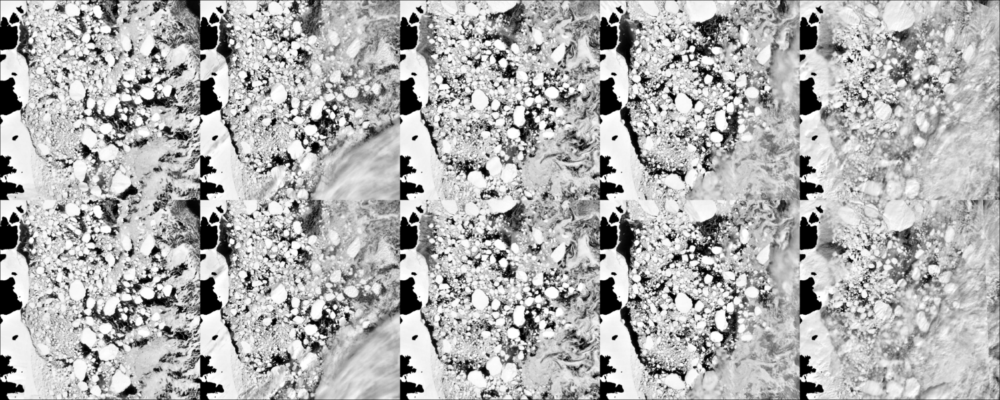

In [45]:
mosaicview(proc_gray_imgs, nrow=2)

In [46]:
k = 4
kmeans_result = kmeans_binarization.(
        proc_gray_imgs,
        fc_masked;
        k=k,
        maxiter=50,
        random_seed=45,
        cluster_selection_algorithm=IceDetectionBrightnessPeaksMODIS721(
            band_7_max=0.1, possible_ice_threshold=0.3, nbins=128, join_method="union"
            )
        );

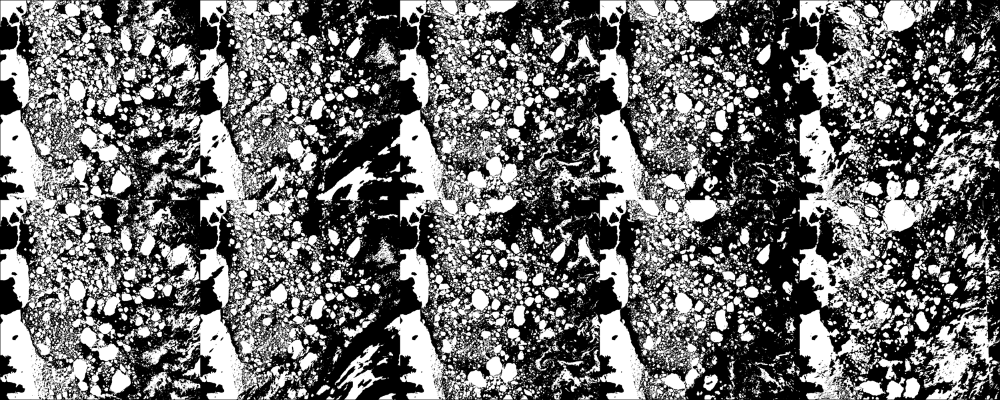

In [47]:
mosaicview(kmeans_result .|> r -> Gray.(r), nrow=2)

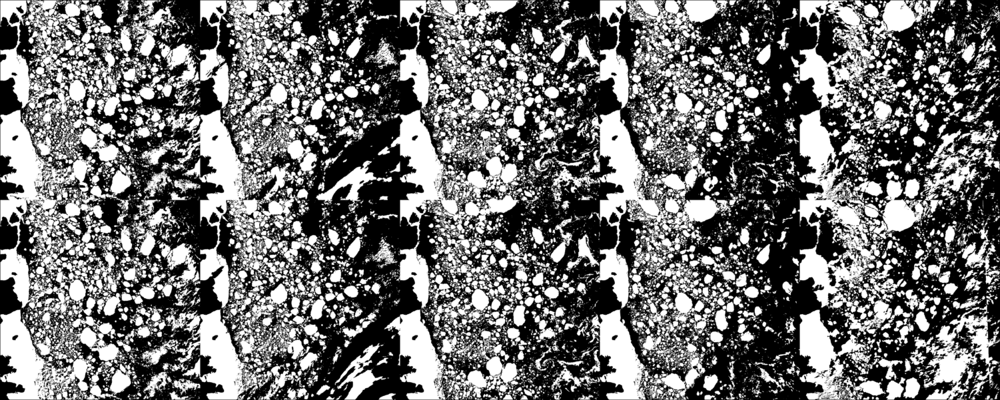

In [48]:
kmeans_cleaned = clean_binary_floes.(kmeans_result, prelim_ice_mask, cloud_masks)
mosaicview(kmeans_cleaned .|> r -> Gray.(r), nrow=2)

In [49]:
@time begin
    floes_distance = dist_morph_split.(kmeans_cleaned; max_distance=7);
    dist_overlay = [RGB.(Gray.(img)) for img in truecolor_imgs]
    for idx in range(1, length(truecolor_imgs))
        cview = view_seg_random(SegmentedImage(fc_masked[idx], floes_distance[idx]))
        dist_overlay[idx][floes_distance[idx] .> 0] .= cview[floes_distance[idx] .> 0]
    end
end
nothing

 16.308232 seconds (103.82 M allocations: 15.453 GiB, 18.18% gc time, 3.65% compilation time: 94% of which was recompilation)


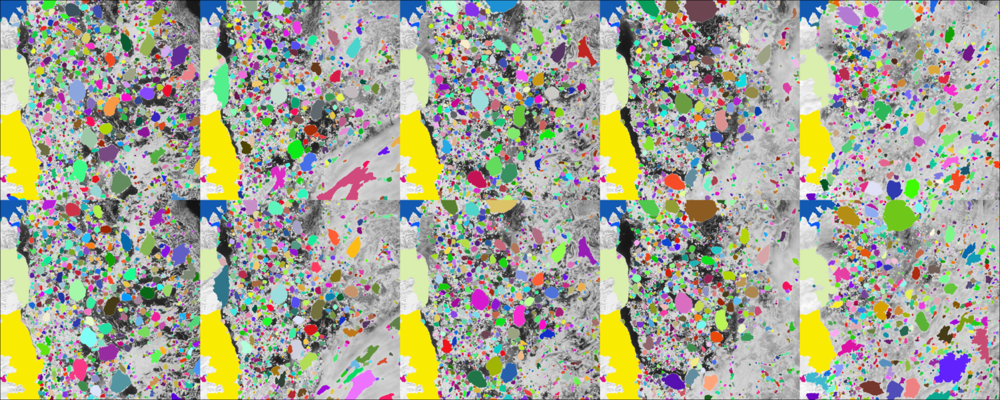

In [50]:
mosaicview(dist_overlay, nrow=2)

In [51]:
save("../figures/greenland_sea_split_floes_no_masking2.png", mosaicview(dist_overlay, nrow=2))

In [52]:
# save results
save.(joinpath.(dataloc, files, "cloud_mask.png"), cloud_masks .|> r -> Gray.(r))
save.(joinpath.(dataloc, files, "ice_mask.png"), prelim_ice_mask .|> r -> Gray.(r))
save.(joinpath.(dataloc, files, "segments.png"), floes_distance .|> r -> Gray.(r ./ maximum(r)))
save.(joinpath.(dataloc, files, "segments_overlay.png"), dist_overlay)
nothing

# Next steps
- Postprocess cleanup (cloud info, shape clarity, etc)
- Get passtimes
- Run tracker
- Visualize (at least, visualize by setting color for each floe so the color shows object tracking)
- Potentially clean up by checking for overlap with clouds

In [55]:
# Set up tracker function
# Each of these functions can be updated to include areas to connect to the piecewise linear functions.
filter_functions = ChainedFilterFunction(;
    filters = [DistanceThresholdFilter(
                    threshold_function = LopezAcostaTimeDistanceFunction(),
                    threshold_column = :time_distance_test,
                    scaling_function = dt -> IceFloeTracker.Tracking.maximum_linear_distance(dt; umax=0.75, eps=250)
            ),
        RelativeErrorThresholdFilter(variable=:area,
             threshold_function=PiecewiseLinearThresholdFunction(minimum_value=0.43, maximum_value=0.17)),
        RelativeErrorThresholdFilter(variable=:convex_area, 
            threshold_function=PiecewiseLinearThresholdFunction(minimum_value=0.44, maximum_value=0.25)),
        RelativeErrorThresholdFilter(variable=:major_axis_length, 
            threshold_function=PiecewiseLinearThresholdFunction(minimum_value=0.27, maximum_value=0.13)),
        RelativeErrorThresholdFilter(variable=:minor_axis_length, 
            threshold_function=PiecewiseLinearThresholdFunction(minimum_value=0.28, maximum_value=0.1)),
        ShapeDifferenceThresholdFilter(
            threshold_function=PiecewiseLinearThresholdFunction(minimum_value=0.47, maximum_value=0.31)),
        PsiSCorrelationThresholdFilter(
            threshold_function=PiecewiseLinearThresholdFunction(minimum_value=0.86, maximum_value=0.96))
        ])

ft = FloeTracker(filter_function=filter_functions,
    matching_function=MinimumWeightMatchingFunction(), minimum_area=300, maximum_area=50e3) # check that area is pixels.

FloeTracker(ChainedFilterFunction(IceFloeTracker.Tracking.AbstractFloeFilterFunction[DistanceThresholdFilter(:Δt, :Δx, :scaled_distance, LopezAcostaTimeDistanceFunction((Minute(20), Minute(90), Hour(24)), (3750.0, 7500.0, 30000.0, 60000.0)), :time_distance_test, var"#116#117"()), RelativeErrorThresholdFilter(:area, :area, :relative_error_test, PiecewiseLinearThresholdFunction(100, 700, 0.43, 0.17)), RelativeErrorThresholdFilter(:convex_area, :area, :relative_error_test, PiecewiseLinearThresholdFunction(100, 700, 0.44, 0.25)), RelativeErrorThresholdFilter(:major_axis_length, :area, :relative_error_test, PiecewiseLinearThresholdFunction(100, 700, 0.27, 0.13)), RelativeErrorThresholdFilter(:minor_axis_length, :area, :relative_error_test, PiecewiseLinearThresholdFunction(100, 700, 0.28, 0.1)), ShapeDifferenceThresholdFilter(:area, :area, :shape_difference_test, PiecewiseLinearThresholdFunction(100, 700, 0.47, 0.31)), PsiSCorrelationThresholdFilter(:area, :psi_s_correlation_test, PiecewiseL

In [56]:
# filtering?
@time begin 
    tracked = ft(floes_distance, passtimes)
end

 61.134245 seconds (1.06 G allocations: 30.942 GiB, 4.37% gc time, 0.06% compilation time)


Row,ID,trajectory_uuid,head_uuid,uuid,area,col_centroid,convex_area,label,major_axis_length,max_col,max_row,min_col,min_row,minor_axis_length,orientation,perimeter,row_centroid,passtime,mask,psi,Δt,Δx,scaled_distance,relative_error_area,relative_error_convex_area,relative_error_major_axis_length,relative_error_minor_axis_length,shape_difference,scaled_shape_difference,psi_s_correlation,psi_s_correlation_score,w
,Int64,String,String?,String,Int64,Float64,Float64,Int64,Float64,Int64,Int64,Int64,Int64,Float64,Float64,Float64,Float64,DateTime,BitMatrix,Array…,Millisec…?,Float64?,Float64?,Float64?,Float64?,Float64?,Float64?,Float64?,Float64?,Float64?,Float64?,Float64?
1,1,04ribhS2GOE8,missing,NCBPGt1LlgAF,928,425.356,949.0,484,39.6058,441,476,409,437,30.3198,-0.147359,121.054,456.454,2023-05-16T12:11:00,Bool[0 0 … 0 0; 0 0 … 0 0; … ; 0 0 … 0 0; 0 0 … 0 0],"[5.17767, 5.17243, 5.5296, 5.76876, 5.4635, 5.27407, 5.13917, 5.21685, 5.81664, 6.50727 … 9.91094, 9.89032, 10.125, 9.9668, 9.878, 10.5074, 10.5264, 10.5374, 11.4198, 10.5406]",missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing,missing
2,1,04ribhS2GOE8,NCBPGt1LlgAF,hmFfosGoC0eQ,923,425.963,942.0,472,39.752,442,476,410,437,30.0289,-0.15608,120.811,456.758,2023-05-16T12:33:00,Bool[0 0 … 0 0; 0 0 … 0 0; … ; 0 0 … 0 0; 0 0 … 0 0],"[5.17124, 4.71435, 4.73295, 5.16873, 5.52515, 5.78261, 5.50843, 5.15242, 5.17804, 5.19535 … 8.94233, 9.8704, 9.37325, 9.90372, 10.1998, 9.85913, 9.91765, 10.1951, 10.5342, 10.5313]",1320000 milliseconds,169.925,0.137036,0.00540249,0.00740349,0.00368393,0.00963841,39.0,0.042,0.994,0.006,0.211164
3,1,04ribhS2GOE8,hmFfosGoC0eQ,YEulklcBQraC,910,428.997,922.0,456,39.2924,444,497,412,458,30.2072,0.0183068,119.64,477.427,2023-05-17T12:53:00,Bool[0 0 … 0 0; 0 0 … 0 0; … ; 0 0 … 0 0; 0 0 … 0 0],"[5.1768, 5.17774, 5.79728, 5.18228, 5.20391, 5.49421, 5.49524, 5.45947, 5.60938, 5.88729 … 8.92473, 9.84392, 9.85464, 9.94502, 10.1893, 10.2118, 10.5093, 10.5206, 10.5466, 10.9892]",87600000 milliseconds,5222.63,0.0791907,0.0141844,0.0214592,0.011629,0.00591802,59.0,0.065,0.995,0.005,0.202381
4,1,04ribhS2GOE8,YEulklcBQraC,M2Sr0JJxajIb,877,428.735,915.0,443,39.7635,444,498,412,459,29.2866,0.0211021,121.64,478.295,2023-05-17T13:14:00,Bool[0 0 … 0 0; 0 0 … 0 0; … ; 0 0 … 0 0; 0 0 … 0 0],"[5.17663, 5.17357, 5.50579, 5.15907, 5.50299, 5.84681, 5.45683, 5.17645, 5.59779, 5.86329 … 8.90281, 9.91459, 9.89368, 10.1706, 10.5679, 9.86413, 10.5134, 10.5313, 10.5281, 10.9974]",1260000 milliseconds,226.58,0.189607,0.0369334,0.00762112,0.0119199,0.030947,93.0,0.106,0.995,0.005,0.388028
5,1,04ribhS2GOE8,M2Sr0JJxajIb,ff8dVZvIJawv,863,448.689,889.0,457,39.712,468,515,428,485,28.1816,-1.26773,118.225,500.438,2023-05-18T13:35:00,Bool[0 0 … 0 0; 0 0 … 0 0; … ; 0 0 … 0 0; 0 0 … 0 0],"[5.16619, 4.71633, 4.75518, 5.10838, 5.20943, 5.24603, 5.42382, 5.17542, 5.16015, 5.72743 … 8.99344, 9.20907, 9.89948, 9.8892, 10.1364, 10.5783, 10.4751, 10.5329, 10.5337, 10.5338]",87660000 milliseconds,7451.76,0.112914,0.016092,0.0288248,0.00129636,0.0384555,153.0,0.177,0.988,0.012,0.386583
6,1,04ribhS2GOE8,ff8dVZvIJawv,aCStD2Qd9aOp,858,449.374,881.0,450,39.2565,469,515,429,485,28.3922,-1.26336,118.468,500.749,2023-05-18T13:55:00,Bool[0 0 … 0 0; 0 0 … 0 0; … ; 0 0 … 0 0; 0 0 … 0 0],"[5.17597, 5.15421, 4.27132, 4.7381, 5.17238, 5.1658, 5.48754, 5.24411, 5.12746, 5.55667 … 8.40358, 8.92523, 9.84887, 9.88394, 9.89082, 10.181, 10.5528, 10.5086, 10.2141, 10.5331]",1200000 milliseconds,188.041,0.163514,0.00581058,0.00903955,0.0115361,0.00744284,41.0,0.048,0.999,0.001,0.246343
7,1,04ribhS2GOE8,aCStD2Qd9aOp,gWjyryHhgZGH,909,456.695,951.0,431,39.9985,476,544,437,511,29.555,-1.03377,124.811,528.123,2023-05-19T12:39:00,Bool[0 0 … 0 0; 0 0 … 0 0; … ; 0 0 … 0 0; 0 0 … 0 0],"[5.17632, 5.16578, 4.71658, 4.73922, 5.16392, 5.48449, 5.57887, 5.82665, 5.4498, 5.27427 … 8.97009, 9.32597, 10.1347, 10.2581, 10.1391, 10.5163, 10.575, 10.5142, 10.5313, 10.5326]",81840000 milliseconds,7083.98,0.114944,0

In [57]:
satellites = [split(f, ".")[end] for f in files]
satellite_by_date = Dict(p => s for (p, s) in zip(passtimes, satellites))
ptimes = deepcopy(tracked[:, "passtime"])
tracked[:, "satellite"] = replace(ptimes, satellite_by_date...);

# Convert from Milliseconds to integers and put unit in column name
tracked[:, "dt_seconds"] = coalesce.(passmissing(r -> Float64(r.value/1e3)).(tracked.Δt), NaN);
tracked[:, "dx_meters"] = coalesce.(tracked.Δx, NaN)
tracked[:, "dxdt_mps"] = tracked[:, "dx_meters"] ./ tracked[:, "dt_seconds"]
# Save the result with the time indices
# Note that to merge these, we'll need to compare location matches to update the floe IDs.
save("../data/greenland_sea/greenland-sea-tracking_"*string(Date(first(passtimes)))*"_"*string(Date(last(passtimes)))*".csv", select(tracked, Not(:mask, :psi)))